# EDA von Gebrauchtwagenangeboten der Website "Autoscout24"

*Von Annika Scheug und Oliver Schabe, Vorlesung "Python for Data Science", Sommersemester 2022*

## Einleitung

In diesem Projekt wird eine Explorative Datenanalyse von Gebrauchtwagenangeboten der Website "Autoscout24" durchgeführt. <br>
Autoscout24 (https://www.autoscout24.de/) ist eine Online-Plattform zum Kauf und Verkauf von Neu- und Gebrauchtwagen. <br>
Die Startseite von Autoscout24 sieht folgendermaßen aus: <br>
![Autoscout24 Startseite](Autoscout24.png)

Die Suchergebnisse werden in einer Liste dargestellt, wobei immer 20 Fahrzeuge pro Seite angezeigt werden und je Suchergebniss 20 Seiten: <br>
![Autoscout24 Suche](Autoscout24Suche.png) 

Ziel des Projektes ist es, Daten über Zustand und Ausstattung verschiedener Fahrzeuge aus dem Quellcode der Website abzuziehen und diese Daten anschließend ausführlich zu analysieren.
Bei der Analyse der Daten sollen mögliche Korrelationen zwischen den in den Angeboten angegebenen Werten untersucht werden. Der Schwerpunkt soll dabei auf dem Preis und den Fahrzeugeigenschaften liegen, die einen relevanten Einfluss auf den Verkaufspreis haben (wie möglicherweise Kilometerstand, Alter des Fahrzeuges etc.). <br>
Als möglicher praktischer Anwendungsfall der hier gesammelten Erkentnisse könnte beispielsweise ein Tool sein, welches interessierten Käufern oder Verkäufern realistische Preisvorschläge auf Basis von Angaben zum Fahrzeugszustand macht.  
Die Entwicklung einer solchen Applikation ist jedoch nicht im Scope dieses Projektes.

## Import

Zunächst werden alle für dieses Projekt benötigten Packages und Bibliotheken importiert.

In [1]:
#Basics
import pandas as pd
import numpy as np

#Webcrawling
#pip install beautifulsoup4
from bs4 import BeautifulSoup
import requests

#Deactivate warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


In [2]:
#Data visualization
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.graph_objs as go
import plotly.io as pio
import plotly.figure_factory as ff
import plotly.offline as pyo
# Set notebook mode to work in offline
pyo.init_notebook_mode()

import seaborn as sns 

np.set_printoptions(precision=6)
np.set_printoptions(suppress=True)
pd.set_option("display.max_columns", 200)
pd.set_option("display.max_rows", 200)

In [3]:
#Geo visualization
import folium
#!pip install geopy
from geopy.geocoders import Nominatim

#Postgre SQL
import psycopg2 
import json 
from sqlalchemy import create_engine 

#Regression
import statsmodels.formula.api as smf

## Webcrawling & Creation of Dataframe

Als Erstes ist es notwendig, die Fahrzeugdaten von der Webseite Autoscout24 zu crawlen und in einem Dataframe zu speichern. 

Für das Crawlen der Daten wird die Methode *extractPageCarDF* definiert. Dieser muss beim Aufruf die Variable *URL* mitgegeben werden. Dabei handelt es sich um den Link zu einem Autoscout24 Suchergebnis, welches stehts 20 Autos beinhaltet (sofern sie den Suchkriterien entsprechen). <br>
Jedes Auto wird dabei vom HTML Element *Article* umschlossen. Daher wird eine Schleife implementiert, welche für jedes Auto im Suchergebnis die nachfolgenden Daten aus den dazugehörigen HTML Elementen der Webseite extrahiert: <br>
* Titel
* Fahrzeugversion
* Untertitel
* Preis
* Leasingpreis
* Fahrzeugstandort

Falls eines der HTML-Elemente nicht gefunden werden kann, wird jede der Anweisungen durch einen try except Block umschlossen. Falls kein Eintrag gefunden wird, wird der jeweilige Wert mit einem NULL-Wert belegt.

Eine Besonderheit ist zudem der Preis. Wird das Element *ListItem_pricerow* gefunden, handelt es sich um einen Verkaufspreis und kein Leasingangebot. *Leasing* wird daher False gesetzt. Wird dieses Element nicht gefunden, sondern *LeasingPrice_price* handelt es sich um ein Leasing Angebot.

Diese Daten werden dem Dataframe *pageCarDF* hinzugefügt. 

In einer weiteren Schleife werden die folgenden Fahrzeugdetaildaten aus dem HTML Div Container *VehicleDetailTable* abgezogen: <br>
![Autoscout24 VehicleDetailTable](VehicleDetailTable.png) <br>
Es wird zunächst ein leeres Dataframe initialisiert.
In einer Schleife wird für jedes Fahrzeug die leere Liste *VehicleDetailList* erzeugt und dieser in einer inneren Schleife jedes Element der *VehicleDetailTable* hinzugefügt. <br>
Die Liste wird anschließend dem *VehicleDetailDF* hinzugefügt. Hierfür ist ein try except notwendig. Leasing Fahrzeuge haben ein zweites Element namens *VehicleDetailTable*, welches allerdings nur 3 Einträge zum Themengebiet Leasing hat. Der Versuch diese Listen mit 3 Einträgen dem *VehicleDetailDF* hinzuzufügen, läuft aufgrund nicht passender Längen auf Fehler. Dieser Fehler wird im except Block bewusst mit einem Continue abgefangen. Die Leasing *VehicleDetailLists* werden nicht weiter benötigt und fallen somit raus. <br>

Nun liegt das *pageCarDF* und das *VehicleDetailDF* vor, welche beide je Fahrzeug eine Zeile beinhalten.<br>
Die beiden Dataframes werden mithilfe der merge-Methode über den Index gejoined. <br>

Die Methode gibt das Dataframe *pageCarDF* als return value zurück. Diese beinhaltet alle relevanten Daten von den Fahrzeugen einer Suchergebnisseite (in der Regel 20 Fahrzeuge).

In [4]:
def extractPageCarDF(URL):

    soup=BeautifulSoup(requests.get(URL).text,"html.parser")
    pageCarDF=pd.DataFrame()

    for car in soup.findAll("article"):
        data = car.find("div", {"class": lambda L: L and L.startswith("ListItem_wrapper")})
        try:
            header = data.find("h2").text
        except:
            header = np.NaN
        try:
            version = data.find("span", {"class": lambda L: L and L.startswith("ListItem_version")}).text
        except:
            version = np.NaN
        try:
            subtitle = data.find("span", {"class": lambda L: L and L.startswith("ListItem_subtitle")}).text
        except:
            subtitle = np.NaN
        try:
            #Versuch Preis Element zu finden
            price = data.find("div", {"class": lambda L: L and L.startswith("ListItem_pricerow")}).text
            leasing = False
        except:
            #wenn oberes Element nicht gefunden werden kann, handelt es sich um einen Leasing Wagen, mit dem nachfolgenden HTML Element
            price = data.find("span", {"class": lambda L: L and L.startswith("LeasingPrice_price")}).text
            leasing = True 

        try:
            location = car.find("span", {"style": lambda L: L and L.startswith("grid-area:address")}).text
        except:
            location = np.NaN

        #Daten dem pageCarDF hinzufügen
        pageCarDF = pageCarDF.append({"Titel":header, "Version":version, "Untertitel":subtitle, "Preis":price, "Leasing":leasing, "Standort":location}, ignore_index=True)


    #VehicleDetailTable
    VehicleDetailDF = pd.DataFrame()
    for car in soup.findAll("div" , {"class":"VehicleDetailTable_container__mUUbY"}):
        VehicleDetailList = []
        for c in car:
            VehicleDetailList.append(c.text)
        try:
            VehicleDetailDF = VehicleDetailDF.append({"km":VehicleDetailList[0], "Erstzulassung":VehicleDetailList[1], "PS":VehicleDetailList[2], "Zustand":VehicleDetailList[3], "Fahrzeughalter":VehicleDetailList[4], "Getriebe":VehicleDetailList[5], "Kraftstoff": VehicleDetailList[6], "Verbrauch_l_pro_100km":VehicleDetailList[7], "Emissionen_g_pro_km":VehicleDetailList[8]}, ignore_index=True)
        except:
            continue #VehicleDetailLists mit Länge 3 sind extra VehicleDetailTables, die nur bei Leasing Wagen vorkommen. Diese sollen nicht übernommen werden, daher Continue
    
    #Join pageCarDF und VehicleDetailDF
    pageCarDF = pd.merge(pageCarDF, VehicleDetailDF, left_index=True, right_index=True)   

    return pageCarDF


Die Methode extractPageCarDF gilt es nun mit den passenden Paramentern aufzurufen. 

Es werden zunächst zwei leere Dataframes initialisiert. <br>
Die Suche auf Autoscout24 wurde zunächst komplett ohne Filter aufgerufen. Pro Suchergebnis gibt die Webseite ingesamt 20 Suchergebnisseiten mit jeweils 20 Fahrzeugen aus. Somit können mit einer Suche maximal 20 * 20 = 400 Autos von der Webseite gecrawlt werden. <br>
Da für die Analysen im Projekt mehr als 400 Datensätze gewünscht sind, wird ein Filter "Erstzulassung von" (fregfrom) und "Erstzulassung bis" (fregto) gesetzt. Die Jahreszahlen werden in der Liste fregtoList von 1990 bis 2022 in 1 Jahresschritten gewählt. 

In einer Schleife wird zunächst der Filter auf die jeweilige Jahreszahl gesetzt. In einer inneren Schleife wird jeweils die Ergebnisseite der Suche festgelegt. Somit werden pro Iteration der äußeren Schleife 20 Seiten des Suchergebnisses gecrawlt. <br>
Dafür wird zunächst die URL aus "Erstzulassung von" fregfrom= , "Erstzulassung bis" fregto= und Suchergebnisseite page erstellt. Die URL wird an die Methode extractPageCarDF übergeben und diese ausgeführt. <br>
Das resultierende Dataframe pageCarDF mit 20 Fahrzeugen wird dem Dataframe AutoDFraw angehängt. Anschließend wird die Methode für die nächste Seite im Suchergebnis ausgeführt und das Ergebnis wieder AutoDFraw hinzufügt. <br>
Dataframe pageCarDF wird somit bei jeder Ausführung der Methode extractPageCarDF neu erstellt, während Dataframe AutoDFraw immer weiter wächst. 

Die Methode wird für jeden Filter "Erstzulassung bis" für 20 Suchergebnisseiten ausgeführt, sodass das Dataframe AutoDFraw am Ende über 6000 Einträge enhält.

In [5]:
AutoDFraw=pd.DataFrame()
pageCarDF=pd.DataFrame()
baselink = "https://www.autoscout24.de/lst?fregfrom="
fregList = list(range(1990, 2022, 1))

for freg in fregList:
    for page in range(20):
        URL = baselink + str(freg) + "&fregto=" + str(freg) + "&page=" + str(page)
        pageCarDF = extractPageCarDF(URL)
        AutoDFraw=pd.concat([AutoDFraw, pageCarDF],axis=0, ignore_index=True)


In [67]:
AutoDFraw

,Titel,Version,Untertitel,Preis,Leasing,Standort,km,Erstzulassung,PS,Zustand,Fahrzeughalter,Getriebe,Kraftstoff,Verbrauch_l_pro_100km,Emissionen_g_pro_km
0,Volkswagen Golf,II GL Tuningfahrz. für Schrauber rostfrei viel...,NaN,"€ 2.950,-Keine Angabe",False,DE-92318 Neumarkt,139.800 km,06/1990,66 kW (90 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),0 g/km (komb.)
1,Renault Alpine A310,2.5 Turbo V6,NaN,"€ 23.900,-",False,Contáctanos en: • ES-27003 LUGO,73.000 km,01/1990,147 kW (200 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),- (g/km)
2,Mercedes-Benz 190,190E 2.5-16,NaN,"€ 31.500,-",False,Contáctanos en: • ES-15800 MELIDE,90.000 km,03/1990,143 kW (194 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),- (g/km)
3,BMW Z1,"2,7 Ltr.+BBS+RESTAURIERT+HARDTOP",NaN,"€ 73.900,-Keine Angabe",False,Ihr Verkaufsteam • DE-49076 Osnabrück,75.156 km,06/1990,150 kW (204 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),0 g/km (komb.)
4,Alfa Romeo Spider,2.0 Quadrifoglio Verde,NaN,"€ 19.900,-",False,Contáctanos en: • ES-46006 VALENCIA,79.000 km,09/1990,94 kW (128 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),- (g/km)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12174,Audi A3,advanced 40TFSI S-line PDC SMARTINT,Käsmann - die große Auswahl im Neckar-Odenwald...,"€ 37.930,-Keine Angabe",False,Audi: 06261-9282-555 VW+Skoda: 06261-9730-555 ...,2.653 km,12/2021,140 kW (190 PS),Gebraucht,1 Fahrzeughalter,Automatik,Benzin,- (l/100 km),- (g/km)
12175,Volkswagen Golf,VIII 1.5 TSI OPF -Active- 6-Gang Navi/ SHZ,"Standheizung, Navigationssystem, 3-Zonen-Klima...","€ 25.480,-Sehr guter Preis",False,Kundenkontaktcenter • DE-24944 Flensburg,8.400 km,08/2021,96 kW (131 PS),Gebraucht,1 Fahrzeughalter,Schaltgetriebe,Benzin,"5,1 l/100 km (komb.)",117 g/km (komb.)
12176,Kia Ceed / cee'd,Ceed Sportswagon Spirit Rückfahrkamera,Ihr Kia und Mitsubishi Vertragshändler,"€ 24.489,-Fairer Preis",False,DE-39576 Stendal,19.700 km,05/2021,103 kW (140 PS),Gebraucht,1 Fahrzeughalter,Schaltgetriebe,Benzin,,146 g/km (komb.)
12177,BMW 318,"iA Lim. AHK|Glasdach|Navi|HUD|LED|17""LM|SHZ","Schiebedach, Einparkhilfe Kamera, Anhängerkupp...","€ 33.699,-Sehr guter Preis",False,- - • DE-46149 Oberhausen,12.103 km,01/2021,115 kW (156 PS),Gebraucht,1 Fahrzeughalter,Automatik,Benzin,"6,3 l/100 km",142 g/km (komb.)


Abschließend werden die gecrawlten Daten in einer postgreSQL Datenbank gesichert, sodass nicht bei jeder Programmausführung die Daten neu gecrawlt werden müssen.

Dafür muss zunächst eine Verbindung mit der Datenbank hergestellt werden. Das eingelesene JSON-File enthält die Datenbank-Parameter und muss von jedem Anwender mit seinen Zugangsdaten befüllt und im gleichen Dateipfad wie dieses Juypter-Notebook abgespeichert werden.

Das JSON-File benötigt folgende Informationen im gezeigten Format: <br>
![configLocalDS.json](configLocalDS.png)


In [21]:
#import json file for database connection parameters
with open('configLocalDS.json') as f:
    conf = json.load(f)

Anschließend wird unter Verwendung von sqlalchemy eine Verbindung zur Datenbank hergestellt.

In [27]:
conn_str ='postgresql://%s:%s@localhost:5432/%s'%(conf["user"], conf["passw"],conf["database"])
engine = create_engine(conn_str)

Das Dataframe wird nun in der Tabelle *autoscout24cars* in postgre SQL gespeichert, sofern die Tabelle noch nicht vorhanden ist. 

In [28]:
if not engine.has_table("autoscout24cars"):
    AutoDFraw.to_sql(name='autoscout24cars',index=True, index_label='index',con=engine)
else:
    print("table already exists")

C:\Users\Admin\AppData\Local\Temp/ipykernel_6452/3504836538.py:1: SADeprecationWarning:

The Engine.has_table() method is deprecated and will be removed in a future release.  Please refer to Inspector.has_table(). (deprecated since: 1.4)



table already exists


Als Alternative zu SQL können die Daten in Excel gespeichert und wieder eingelesen werden um einen gleichbleibenden Datenstand zur Analyse zu gewährleisten: <br>
Diese Codezeile ist hier auskommentiert, um das Backup nur bewusst überschreiben zu können.

In [ ]:
#AutoDFraw.to_excel("AutoDF_raw.xlsx")

Die Fahrzeugdaten von Autoscout24 wurden erfolgreich abgezogen und in einem Dataframe gespeichert. Allerdings entsprechen viele Spalten noch nicht dem gewünschten Format, da beispielsweise Sonderzeichen enthalten sind oder numerische Werte nicht als solche erkannt werden. <br>
Aus diesem Grund muss das Dataframe nun so bearbeitet werden, dass alle Spalten in einer für die Explorative Datenanalyse sinnvollen Struktur vorliegen.

Zunächst werden die in SQL gesicherten Daten in ein neues Dataframe *AutoDF* geladen.

In [31]:
AutoDF = pd.read_sql_query('SELECT * FROM autoscout24cars',engine, index_col="index")
AutoDF

,Titel,Version,Untertitel,Preis,Leasing,Standort,km,Erstzulassung,PS,Zustand,Fahrzeughalter,Getriebe,Kraftstoff,Verbrauch_l_pro_100km,Emissionen_g_pro_km
index,,,,,,,,,,,,,,,
0,Volkswagen Golf,II GL Tuningfahrz. für Schrauber rostfrei viel...,None,"€ 2.950,-Keine Angabe",False,DE-92318 Neumarkt,139.800 km,06/1990,66 kW (90 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),0 g/km (komb.)
1,Renault Alpine A310,2.5 Turbo V6,None,"€ 23.900,-",False,Contáctanos en: • ES-27003 LUGO,73.000 km,01/1990,147 kW (200 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),- (g/km)
2,Mercedes-Benz 190,190E 2.5-16,None,"€ 31.500,-",False,Contáctanos en: • ES-15800 MELIDE,90.000 km,03/1990,143 kW (194 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),- (g/km)
3,BMW Z1,"2,7 Ltr.+BBS+RESTAURIERT+HARDTOP",None,"€ 73.900,-Keine Angabe",False,Ihr Verkaufsteam • DE-49076 Osnabrück,75.156 km,06/1990,150 kW (204 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),0 g/km (komb.)
4,Alfa Romeo Spider,2.0 Quadrifoglio Verde,None,"€ 19.900,-",False,Contáctanos en: • ES-46006 VALENCIA,79.000 km,09/1990,94 kW (128 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),- (g/km)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12174,Audi A3,advanced 40TFSI S-line PDC SMARTINT,Käsmann - die große Auswahl im Neckar-Odenwald...,"€ 37.930,-Keine Angabe",False,Audi: 06261-9282-555 VW+Skoda: 06261-9730-555 ...,2.653 km,12/2021,140 kW (190 PS),Gebraucht,1 Fahrzeughalter,Automatik,Benzin,- (l/100 km),- (g/km)
12175,Volkswagen Golf,VIII 1.5 TSI OPF -Active- 6-Gang Navi/ SHZ,"Standheizung, Navigationssystem, 3-Zonen-Klima...","€ 25.480,-Sehr guter Preis",False,Kundenkontaktcenter • DE-24944 Flensburg,8.400 km,08/2021,96 kW (131 PS),Gebraucht,1 Fahrzeughalter,Schaltgetriebe,Benzin,"5,1 l/100 km (komb.)",117 g/km (komb.)
12176,Kia Ceed / cee'd,Ceed Sportswagon Spirit Rückfahrkamera,Ihr Kia und Mitsubishi Vertragshändler,"€ 24.489,-Fairer Preis",False,DE-39576 Stendal,19.700 km,05/2021,103 kW (140 PS),Gebraucht,1 Fahrzeughalter,Schaltgetriebe,Benzin,None,146 g/km (komb.)


Alternativ, falls die Verbindung zu postgreSQL scheitert, können die Daten auch aus dem Backup Excel geladen werden. Dieser Code ist aktuell auskommentiert und muss bei Bedarf aktiviert werden.

In [41]:
AutoDF=pd.read_excel("AutoDF_raw.xlsx",index_col=0)

## Feature Engineering

### Erzeugung zusätzlicher Variablen

#### Automarke

Eine für die Datenanalyse interessante Information ist die Automarke. Diese ist im Titel der Anzeige als erstes Wort enthalten. Daher wird zur Bestimmung der Automarke das erste Wort der Spalte *Titel* extrahiert und in einer neuen Spalte *Marke* gespeichert. Falls eine Automarke aus mehr als einem Wort besteht, wird lediglich das erste Wort übernommen.

In [43]:
# Erzeugen der Spalte "Marke" aus den Informationen der Spalte "Titel"
AutoDF['Marke'] = AutoDF['Titel'].str.split('\s+').str[0]

#### Ausstattung

In der Spalte Untertitel werden Ausstattungsmerkmale des Fahrzeugs aufgezählt. Einige ausgewählte Austattungsmerkmale werden als extra Spalten in das Dataframe aufgenommen.
Dafür wird folgende Annahme getroffen:
Ein Fahrzeug besitzt eine bestimmte Ausstattung, wenn diese in Spalte Untertitel erwähnt wird. Wird diese dort nicht erwähnt, besitzt ein Fahrzeug diese Ausstattung nicht.
Dies wird mithilfe der Methode str.contains geprüft.

In [44]:
# Erzeugung zusätzlicher Variablen "Ausstattung" 
AutoDF['Alufelgen']= AutoDF['Untertitel'].str.contains("Alufelgen")
AutoDF['Sitzheizung']= AutoDF['Untertitel'].str.contains("Sitzheizung")
AutoDF['Klimaanlage']= (AutoDF['Untertitel'].str.contains("Klimaanlage")) | (AutoDF['Untertitel'].str.contains("Klimaautomatik"))
AutoDF['Einparkhilfe']= AutoDF['Untertitel'].str.contains("Einparkhilfe ")
AutoDF['Navigationssystem']= AutoDF['Untertitel'].str.contains("Navigationssystem")
AutoDF.head()

,Titel,Version,Untertitel,Preis,Leasing,Standort,km,Erstzulassung,PS,Zustand,Fahrzeughalter,Getriebe,Kraftstoff,Verbrauch_l_pro_100km,Emissionen_g_pro_km,Marke,Alufelgen,Sitzheizung,Klimaanlage,Einparkhilfe,Navigationssystem
0,Volkswagen Golf,II GL Tuningfahrz. für Schrauber rostfrei viel...,NaN,"€ 2.950,-Keine Angabe",False,DE-92318 Neumarkt,139.800 km,06/1990,66 kW (90 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),0 g/km (komb.),Volkswagen,NaN,NaN,False,NaN,NaN
1,Renault Alpine A310,2.5 Turbo V6,NaN,"€ 23.900,-",False,Contáctanos en: • ES-27003 LUGO,73.000 km,01/1990,147 kW (200 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),- (g/km),Renault,NaN,NaN,False,NaN,NaN
2,Mercedes-Benz 190,190E 2.5-16,NaN,"€ 31.500,-",False,Contáctanos en: • ES-15800 MELIDE,90.000 km,03/1990,143 kW (194 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),- (g/km),Mercedes-Benz,NaN,NaN,False,NaN,NaN
3,BMW Z1,"2,7 Ltr.+BBS+RESTAURIERT+HARDTOP",NaN,"€ 73.900,-Keine Angabe",False,Ihr Verkaufsteam • DE-49076 Osnabrück,75.156 km,06/1990,150 kW (204 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),0 g/km (komb.),BMW,NaN,NaN,False,NaN,NaN
4,Alfa Romeo Spider,2.0 Quadrifoglio Verde,NaN,"€ 19.900,-",False,Contáctanos en: • ES-46006 VALENCIA,79.000 km,09/1990,94 kW (128 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),- (g/km),Alfa,NaN,NaN,False,NaN,NaN


#### Geodaten

Aus der Spalte *Standort* wird nun der Stadtname extrahiert, um eine spätere Kartendarstellung des Fahrzeugstandorts zu ermöglichen. Dies ist immer das letzt Wort der Spalte.

In [45]:
#Stadtname
AutoDF['Stadt'] = AutoDF['Standort'].str.split(' ').str[-1]
AutoDF.head()

,Titel,Version,Untertitel,Preis,Leasing,Standort,km,Erstzulassung,PS,Zustand,Fahrzeughalter,Getriebe,Kraftstoff,Verbrauch_l_pro_100km,Emissionen_g_pro_km,Marke,Alufelgen,Sitzheizung,Klimaanlage,Einparkhilfe,Navigationssystem,Stadt
0,Volkswagen Golf,II GL Tuningfahrz. für Schrauber rostfrei viel...,NaN,"€ 2.950,-Keine Angabe",False,DE-92318 Neumarkt,139.800 km,06/1990,66 kW (90 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),0 g/km (komb.),Volkswagen,NaN,NaN,False,NaN,NaN,Neumarkt
1,Renault Alpine A310,2.5 Turbo V6,NaN,"€ 23.900,-",False,Contáctanos en: • ES-27003 LUGO,73.000 km,01/1990,147 kW (200 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),- (g/km),Renault,NaN,NaN,False,NaN,NaN,LUGO
2,Mercedes-Benz 190,190E 2.5-16,NaN,"€ 31.500,-",False,Contáctanos en: • ES-15800 MELIDE,90.000 km,03/1990,143 kW (194 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),- (g/km),Mercedes-Benz,NaN,NaN,False,NaN,NaN,MELIDE
3,BMW Z1,"2,7 Ltr.+BBS+RESTAURIERT+HARDTOP",NaN,"€ 73.900,-Keine Angabe",False,Ihr Verkaufsteam • DE-49076 Osnabrück,75.156 km,06/1990,150 kW (204 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),0 g/km (komb.),BMW,NaN,NaN,False,NaN,NaN,Osnabrück
4,Alfa Romeo Spider,2.0 Quadrifoglio Verde,NaN,"€ 19.900,-",False,Contáctanos en: • ES-46006 VALENCIA,79.000 km,09/1990,94 kW (128 PS),Gebraucht,- (Fahrzeughalter),Schaltgetriebe,Benzin,- (l/100 km),- (g/km),Alfa,NaN,NaN,False,NaN,NaN,VALENCIA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12174,Audi A3,advanced 40TFSI S-line PDC SMARTINT,Käsmann - die große Auswahl im Neckar-Odenwald...,"€ 37.930,-Keine Angabe",False,Audi: 06261-9282-555 VW+Skoda: 06261-9730-555 ...,2.653 km,12/2021,140 kW (190 PS),Gebraucht,1 Fahrzeughalter,Automatik,Benzin,- (l/100 km),- (g/km),Audi,False,False,False,False,False,Mosbach
12175,Volkswagen Golf,VIII 1.5 TSI OPF -Active- 6-Gang Navi/ SHZ,"Standheizung, Navigationssystem, 3-Zonen-Klima...","€ 25.480,-Sehr guter Preis",False,Kundenkontaktcenter • DE-24944 Flensburg,8.400 km,08/2021,96 kW (131 PS),Gebraucht,1 Fahrzeughalter,Schaltgetriebe,Benzin,"5,1 l/100 km (komb.)",117 g/km (komb.),Volkswagen,False,False,True,True,True,Flensburg
12176,Kia Ceed / cee'd,Ceed Sportswagon Spirit Rückfahrkamera,Ihr Kia und Mitsubishi Vertragshändler,"€ 24.489,-Fairer Preis",False,DE-39576 Stendal,19.700 km,05/2021,103 kW (140 PS),Gebraucht,1 Fahrzeughalter,Schaltgetriebe,Benzin,NaN,146 g/km (komb.),Kia,False,False,False,False,False,Stendal
12177,BMW 318,"iA Lim. AHK|Glasdach|Navi|HUD|LED|17""LM|SHZ","Schiebedach, Einparkhilfe Kamera, Anhängerkupp...","€ 33.699,-Sehr guter Preis",False,- - • DE-46149 Oberhausen,12.103 km,01/2021,115 kW (156 PS),Gebraucht,1 Fahrzeughalter,Automatik,Benzin,"6,3 l/100 km",142 g/km (komb.),BMW,False,True,False,True,False,Oberhausen


### Entfernen unerwünschter Zeichen und Werte

Im nächsten Schritt wird das Dataframe um störende oder überflüssige Character bereinigt. Dazu gehören störende Satzzeichen, Währungen, Strings, etc. 

Da in einzelnen Fällen zusätzlich optionale Leasingpreise noch hinter Kaufpreisen angezeigt werden, müssen zuerst alle Zeichen hinter dem ersten Kaufpreis entfernt werden.  Dann werden in der nächsten Codezeile alle weiteren nicht numerischen Zeichen entfernt.

In [47]:
# Bereinigung der Spalte "Preis"
AutoDF['Preis'] = AutoDF['Preis'].replace('(,-).*', '',regex=True)
AutoDF['Preis'] = AutoDF['Preis'].str.replace(r'[^0-9]+', '')

Da der Monat der Erstzulassung voraussichtlich keine große Rolle spielt und die Analyse der Spalte *Erstzulassung* erschwert, wird dieser entfernt sowie alle übrigbleibenden nicht numerischen Zeichen.

In [48]:
# Bereinigung der Spalte "Erstzulassung"
AutoDF['Erstzulassung'] = AutoDF['Erstzulassung'].replace('.*/', '',regex=True)
AutoDF['Erstzulassung'] = AutoDF['Erstzulassung'].replace(r'[^0-9]+', '',regex=True)

Bei der PS-Angabe  muss zuerst der Wert in kW entfernt werden, danach alle weiteren nicht numerischen Zeichen.

In [49]:
# Bereinigung der Spalte "PS"
AutoDF['PS'] = AutoDF['PS'].replace(['.*kW','\(','PS\)'], '',regex=True)
AutoDF['PS'] = AutoDF['PS'].replace(r'[^0-9]+', '',regex=True)

Die nachfolgenden Spalten enthalten im Datensatz noch Einheiten. Diese wurden bereits im Spaltentitel integriert (bspw. Emissionen_g_pro_km) und werden somit aus den Datensätzen entfernt, sodass nur noch numerische Werte verbleiben.

In [50]:
# Bereinigung weiterer Spalten
AutoDF['km'] = AutoDF['km'].replace(r'[^0-9]+', '',regex=True)
AutoDF['Fahrzeughalter'] = AutoDF['Fahrzeughalter'].replace(r'[^0-9]+', '',regex=True)
AutoDF['Verbrauch_l_pro_100km'] = AutoDF['Verbrauch_l_pro_100km'].replace(['\(l/100 km\)', 'l/100 km','\(komb.\)'], '',regex=True)
AutoDF['Emissionen_g_pro_km'] = AutoDF['Emissionen_g_pro_km'].replace(r'[^0-9]+', '',regex=True)

Bei der Bereinigung fehlender Werte tritt das Problem auf, dass bei den Attributen *Verbrauch* und *Emissionen* fehlende Werte bei Elektroautos = 0 (also kein Verbrauch in L pro 100km) bedeuten, bei nicht Elektroautos jedoch tatsächlich fehlende Werte. 

Um die Daten daher auswertbar zu machen, werden zuerst Verbrauch und Emissionen bei allen Fahrzeugen auf "NaN" gesetzt, sollten diese in irgendeiner Form fehlen. Dann werden speziell für Elektroautos die Werte auf "0" gesetzt, da nur diese Verbrauch und Emissionen von "0" haben können.

In [51]:
# Alle fehlenden Werte bei Verbrauch und Emissionen werden durch "NaN" ersetzt
AutoDF['Verbrauch_l_pro_100km'] = AutoDF['Verbrauch_l_pro_100km'].replace(['-','','0'], np.NaN,regex=True)
AutoDF['Emissionen_g_pro_km'] = AutoDF['Emissionen_g_pro_km'].replace(['-','','0'], np.NaN,regex=True)

# da keine Angabe bei Verbrauch und Emissionen bei Elektroautos korrekt sein kann, wird der Wert wieder durch 0 ersetzt
AutoDF.loc[AutoDF.Kraftstoff == 'Elektro', 'Verbrauch_l_pro_100km'] = 0
AutoDF.loc[AutoDF.Kraftstoff == 'Elektro', 'Emissionen_g_pro_km'] = 0

Auch bei weiteren Spalten, bei denen die Angabe in der Anzeige wohl optional ist, müssen die fehlenden Werte durch "NaN" ersetzt werden um diese als fehlend bzw. "NULL" in der EDA zu erkennen.

In [52]:
# Weitere fehlende Werte werden durch "NaN" ersetzt
AutoDF['Fahrzeughalter'] = AutoDF['Fahrzeughalter'].replace(['-',''], np.NaN,regex=True)
AutoDF['Erstzulassung'] = AutoDF['Erstzulassung'].replace('', np.NaN,regex=True)
AutoDF['km'] = AutoDF['km'].replace('', np.NaN,regex=True)
AutoDF['PS'] = AutoDF['PS'].replace('', np.NaN,regex=True)

In [53]:
AutoDF.head()

,Titel,Version,Untertitel,Preis,Leasing,km,Erstzulassung,PS,Zustand,Fahrzeughalter,Getriebe,Kraftstoff,Verbrauch_l_pro_100km,Emissionen_g_pro_km,Marke,Alufelgen,Sitzheizung,Klimaanlage,Einparkhilfe,Navigationssystem,Stadt
0,Volkswagen Golf,II GL Tuningfahrz. für Schrauber rostfrei viel...,NaN,2950,False,139800,1990,90,Gebraucht,NaN,Schaltgetriebe,Benzin,NaN,NaN,Volkswagen,NaN,NaN,False,NaN,NaN,Neumarkt
1,Renault Alpine A310,2.5 Turbo V6,NaN,23900,False,73000,1990,200,Gebraucht,NaN,Schaltgetriebe,Benzin,NaN,NaN,Renault,NaN,NaN,False,NaN,NaN,LUGO
2,Mercedes-Benz 190,190E 2.5-16,NaN,31500,False,90000,1990,194,Gebraucht,NaN,Schaltgetriebe,Benzin,NaN,NaN,Mercedes-Benz,NaN,NaN,False,NaN,NaN,MELIDE
3,BMW Z1,"2,7 Ltr.+BBS+RESTAURIERT+HARDTOP",NaN,73900,False,75156,1990,204,Gebraucht,NaN,Schaltgetriebe,Benzin,NaN,NaN,BMW,NaN,NaN,False,NaN,NaN,Osnabrück
4,Alfa Romeo Spider,2.0 Quadrifoglio Verde,NaN,19900,False,79000,1990,128,Gebraucht,NaN,Schaltgetriebe,Benzin,NaN,NaN,Alfa,NaN,NaN,False,NaN,NaN,VALENCIA


In der spalte *Verbrauch_l_pro_100km* wird das Komma zur Dezimaltrennung durch einen Punkt ersetzt, damit die Spalte als float definiert werden kann.

In [54]:
AutoDF['Verbrauch_l_pro_100km'] = AutoDF['Verbrauch_l_pro_100km'].replace(',', '.',regex=True)

Abgesehen von *Klimaanlage* entstehen "NaN" Values in den neu erzeugten Ausstattungsspalten wenn die Spalte *Untertitel* "NaN" ist, daher werden diese nun durch False ersetzt (Wir gehen davon aus, dass die Ausstattung nicht enthalten ist wenn sie nicht im Untertitel erwähnt ist).

In [55]:
AutoDF['Alufelgen'] = AutoDF['Alufelgen'].replace(np.NaN, False)
AutoDF['Sitzheizung'] = AutoDF['Sitzheizung'].replace(np.NaN, False)
AutoDF['Einparkhilfe'] = AutoDF['Einparkhilfe'].replace(np.NaN, False)
AutoDF['Navigationssystem'] = AutoDF['Navigationssystem'].replace(np.NaN, False)
AutoDF

,Titel,Version,Untertitel,Preis,Leasing,km,Erstzulassung,PS,Zustand,Fahrzeughalter,Getriebe,Kraftstoff,Verbrauch_l_pro_100km,Emissionen_g_pro_km,Marke,Alufelgen,Sitzheizung,Klimaanlage,Einparkhilfe,Navigationssystem,Stadt
0,Volkswagen Golf,II GL Tuningfahrz. für Schrauber rostfrei viel...,NaN,2950,False,139800,1990,90,Gebraucht,NaN,Schaltgetriebe,Benzin,NaN,NaN,Volkswagen,False,False,False,False,False,Neumarkt
1,Renault Alpine A310,2.5 Turbo V6,NaN,23900,False,73000,1990,200,Gebraucht,NaN,Schaltgetriebe,Benzin,NaN,NaN,Renault,False,False,False,False,False,LUGO
2,Mercedes-Benz 190,190E 2.5-16,NaN,31500,False,90000,1990,194,Gebraucht,NaN,Schaltgetriebe,Benzin,NaN,NaN,Mercedes-Benz,False,False,False,False,False,MELIDE
3,BMW Z1,"2,7 Ltr.+BBS+RESTAURIERT+HARDTOP",NaN,73900,False,75156,1990,204,Gebraucht,NaN,Schaltgetriebe,Benzin,NaN,NaN,BMW,False,False,False,False,False,Osnabrück
4,Alfa Romeo Spider,2.0 Quadrifoglio Verde,NaN,19900,False,79000,1990,128,Gebraucht,NaN,Schaltgetriebe,Benzin,NaN,NaN,Alfa,False,False,False,False,False,VALENCIA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12174,Audi A3,advanced 40TFSI S-line PDC SMARTINT,Käsmann - die große Auswahl im Neckar-Odenwald...,37930,False,2653,2021,190,Gebraucht,1,Automatik,Benzin,NaN,NaN,Audi,False,False,False,False,False,Mosbach
12175,Volkswagen Golf,VIII 1.5 TSI OPF -Active- 6-Gang Navi/ SHZ,"Standheizung, Navigationssystem, 3-Zonen-Klima...",25480,False,8400,2021,131,Gebraucht,1,Schaltgetriebe,Benzin,5.1,117,Volkswagen,False,False,True,True,True,Flensburg
12176,Kia Ceed / cee'd,Ceed Sportswagon Spirit Rückfahrkamera,Ihr Kia und Mitsubishi Vertragshändler,24489,False,19700,2021,140,Gebraucht,1,Schaltgetriebe,Benzin,NaN,146,Kia,False,False,False,False,False,Stendal
12177,BMW 318,"iA Lim. AHK|Glasdach|Navi|HUD|LED|17""LM|SHZ","Schiebedach, Einparkhilfe Kamera, Anhängerkupp...",33699,False,12103,2021,156,Gebraucht,1,Automatik,Benzin,6.3,142,BMW,False,True,False,True,False,Oberhausen


In der Spalte *Leasing* werden die Werte noch mit 0.0 für False und 1.0 für True ausgegeben. Dies wird in Boolean Werte geändert.

In [56]:
AutoDF['Leasing'] = AutoDF['Leasing'].replace(0.0, False)
AutoDF['Leasing'] = AutoDF['Leasing'].replace(1.0, True)

### Entfernen von fehlenden oder nicht benötigten Werten

Mit der .info() Methode werden nun alle Spalten des Dataframes mit deren Datentypen angezeigt.

In [57]:
AutoDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12179 entries, 0 to 12178
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Titel                  12179 non-null  object
 1   Version                11900 non-null  object
 2   Untertitel             7238 non-null   object
 3   Preis                  12179 non-null  object
 4   Leasing                12179 non-null  bool  
 5   km                     12179 non-null  object
 6   Erstzulassung          12179 non-null  object
 7   PS                     12049 non-null  object
 8   Zustand                12179 non-null  object
 9   Fahrzeughalter         6218 non-null   object
 10  Getriebe               12179 non-null  object
 11  Kraftstoff             12179 non-null  object
 12  Verbrauch_l_pro_100km  8076 non-null   object
 13  Emissionen_g_pro_km    5059 non-null   object
 14  Marke                  12179 non-null  object
 15  Alufelgen          

Das Dataframe hat 22 Spalten. Davon haben die meisten den Datentyp *object*, obwohl es sich bei einigen davon um numerische Werte handelt. Dies muss noch geändert werden. Lediglich die Boolean Spalten wie beispielsweise *Leasing* wurden korrekt identifiziert. <br>
Die meisten Spalten haben keine NULL Werte. Allerdings exisitieren auch Spalten, die sehr viele NULL-Werte aufweisen. Beispielsweise *Emissionen_g_pro_km*. <br>
Nachfolgend werden die NULL-Werte in einer heatmap visuaisiert.



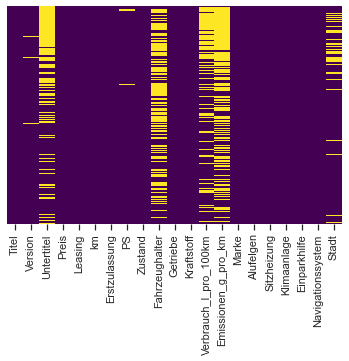

In [58]:
sns.set_theme(style="ticks", color_codes=True)

# Identifizieren der NULL Werte via Heatmap
sns.heatmap(AutoDF.isnull(), 
            yticklabels=False,
            cbar=False, 
            cmap='viridis');

In der Heatmap ist zu erkennen, dass sehr viele NULL-Werte in den Spalten *Untertitel*, *Fahrzeughalter*, *Verbrauch_l_pro_100km* und *Emissionen_g_pro_km* exisitieren. <br>
Nachfolgend werden hierfür nochmal die exakten Mengen ausgegeben:

In [59]:
print(AutoDF.isnull().sum())

Titel                       0
Version                   279
Untertitel               4941
Preis                       0
Leasing                     0
km                          0
Erstzulassung               0
PS                        130
Zustand                     0
Fahrzeughalter           5961
Getriebe                    0
Kraftstoff                  0
Verbrauch_l_pro_100km    4103
Emissionen_g_pro_km      7120
Marke                       0
Alufelgen                   0
Sitzheizung                 0
Klimaanlage                 0
Einparkhilfe                0
Navigationssystem           0
Stadt                    1879
dtype: int64


Die Features *Verbrauch_l_pro_100km*, *Emissionen_g_pro_km*, *km* (Kilometerstand) und *PS* sollen in unserem Use Case  genauer untersucht werden. Daher sollen im Folgenden alle Zeilen mit NULL Values entfernt werden.  
Das Feature *Fahrzeughalter* soll kompett entfernt werden, da dieses auch häufig nicht gepflegt wurde und auch nicht unbedingt aussagekräftig ist über den Zustand & Wert des Autos.

In [60]:
AutoDF = AutoDF[AutoDF['Verbrauch_l_pro_100km'].notna()]
AutoDF = AutoDF[AutoDF['Emissionen_g_pro_km'].notna()]
AutoDF = AutoDF[AutoDF['km'].notna()]
AutoDF = AutoDF[AutoDF['PS'].notna()]
print(AutoDF.isnull().sum())

Titel                       0
Version                    27
Untertitel                946
Preis                       0
Leasing                     0
km                          0
Erstzulassung               0
PS                          0
Zustand                     0
Fahrzeughalter           1418
Getriebe                    0
Kraftstoff                  0
Verbrauch_l_pro_100km       0
Emissionen_g_pro_km         0
Marke                       0
Alufelgen                   0
Sitzheizung                 0
Klimaanlage                 0
Einparkhilfe                0
Navigationssystem           0
Stadt                     379
dtype: int64


Als nächstes sollen alle Leasing Fahrzeuge aus dem DF entfernt werden. Diese waren nur als Werbung zwischen den eigentlichen Gebrauchtwagen Angeboten enthalten und verfälschen mit bspw. Preis (pro Monat als Leasing) die Statistiken.

In [61]:
# Prüfung ob Leasing Fahrzeuge enthalten sind (Leasing == True)
AutoDF["Leasing"].unique()

array([False,  True])

In [62]:
# DF wird neu erstellt nur mit Datensätzen die Leasing == False sind (~AutoDF.Leasing)
AutoDF = AutoDF[~AutoDF.Leasing] 

In [63]:
# Prüfung ob alle Leasing Fahrzeuge entfernt sind
AutoDF["Leasing"].unique()

array([False])

Die Spalte *Leasing* wird nun nicht mehr gebraucht und kann entfernt werden. Das gleiche gilt für die Spalte *Zustand*, da alle Fahrzeuge gebraucht sind und die Spalte *Standort*, da die benötigte Information *Stadt* bereits daraus abgezogen wurde.  
Wie oben erklärt, soll auch die Spalte *Fahrzeughalter* entfernt werden.

In [64]:
# Prüfung ob wirklich nur gebrauchte Fahrzeuge enthalten sind
AutoDF["Zustand"].unique()

array(['Gebraucht'], dtype=object)

In [65]:
# Entfernen der beschriebenen Spalten
AutoDF = AutoDF.drop(columns=['Zustand','Leasing','Fahrzeughalter','Standort'])

### Anpassung der Datentypen

Zunächst wird geprüft, welche Datentypen aktuell vorliegen

In [66]:
AutoDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4570 entries, 7 to 12178
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Titel                  4570 non-null   object
 1   Version                4543 non-null   object
 2   Untertitel             3627 non-null   object
 3   Preis                  4570 non-null   object
 4   km                     4570 non-null   object
 5   Erstzulassung          4570 non-null   object
 6   PS                     4570 non-null   object
 7   Getriebe               4570 non-null   object
 8   Kraftstoff             4570 non-null   object
 9   Verbrauch_l_pro_100km  4570 non-null   object
 10  Emissionen_g_pro_km    4570 non-null   object
 11  Marke                  4570 non-null   object
 12  Alufelgen              4570 non-null   bool  
 13  Sitzheizung            4570 non-null   bool  
 14  Klimaanlage            4570 non-null   bool  
 15  Einparkhilfe        

Als nächstes werden die Datentypen angepasst, indem numerische Spalten einer Datentypkonvertierung unterzogen werden.

In [67]:
AutoDF['Preis'] = AutoDF['Preis'].astype('int')
AutoDF['km'] = AutoDF['km'].astype('int')
AutoDF['PS'] = AutoDF['PS'].astype('int')
AutoDF['Emissionen_g_pro_km'] = AutoDF['Emissionen_g_pro_km'].astype('int')
AutoDF['Erstzulassung'] = AutoDF['Erstzulassung'].astype('float')
AutoDF['Verbrauch_l_pro_100km'] = AutoDF['Verbrauch_l_pro_100km'].astype('float')

Die Spalten *Getriebe*, *Kraftstoff* *Marke* und *Land* weisen jeweils nur eine geringe Menge verschiedener Ausprägungen vor. Daher werden diese Spalten im Typ categorical abgespeichert. Alle übrigen Spalten verbleiben als object.

In [68]:
AutoDF['Getriebe'] = AutoDF['Getriebe'].astype('category')
AutoDF['Kraftstoff'] = AutoDF['Kraftstoff'].astype('category')
AutoDF['Marke'] = AutoDF['Marke'].astype('category')

Nun liegt das Dataframe in einer Form vor, in der die explorative Datenanalyse durchgeführt werden kann.

In [69]:
AutoDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4570 entries, 7 to 12178
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   Titel                  4570 non-null   object  
 1   Version                4543 non-null   object  
 2   Untertitel             3627 non-null   object  
 3   Preis                  4570 non-null   int32   
 4   km                     4570 non-null   int32   
 5   Erstzulassung          4570 non-null   float64 
 6   PS                     4570 non-null   int32   
 7   Getriebe               4570 non-null   category
 8   Kraftstoff             4570 non-null   category
 9   Verbrauch_l_pro_100km  4570 non-null   float64 
 10  Emissionen_g_pro_km    4570 non-null   int32   
 11  Marke                  4570 non-null   category
 12  Alufelgen              4570 non-null   bool    
 13  Sitzheizung            4570 non-null   bool    
 14  Klimaanlage            4570 non-null   

Die bereinigten Daten werden nochmal in einer neuen Tabelle in postgre SQL gesichert.

In [70]:
if not engine.has_table("autoscout24cars-cleaned"):
    AutoDF.to_sql(name='autoscout24cars-cleaned',index=True, index_label='index',con=engine)
else:
    print("table already exists")

NameError: name 'engine' is not defined

## Deskriptive Statistik

### Vorbereitung & allgemeine Untersuchung des DF

Nachfolgend werden alle numerischen Features in einer Liste gespeichert.

In [71]:
num_features=AutoDF.select_dtypes(include=np.number).columns.to_list()
num_features

['Preis',
 'km',
 'Erstzulassung',
 'PS',
 'Verbrauch_l_pro_100km',
 'Emissionen_g_pro_km']

Gleiches wird für alle nicht numerischen Features durchgeführt.

In [72]:
cat_features=AutoDF.select_dtypes(exclude=np.number).columns.to_list()
cat_features

['Titel',
 'Version',
 'Untertitel',
 'Getriebe',
 'Kraftstoff',
 'Marke',
 'Alufelgen',
 'Sitzheizung',
 'Klimaanlage',
 'Einparkhilfe',
 'Navigationssystem',
 'Stadt']

Für einen ersten Überblick über die Datenverteilung numerischer Features bietet sich die describe() Methode an. Diese gibt für jede Spalte die Anzahl, Durchschnitt, Standardabweichung, Minimum, Maximum sowie die Quartile an.

In [73]:
AutoDF.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Preis,4570.0,22212.728228,24413.752948,1.0,7450.00,15999.0,27990.0,349900.0
km,4570.0,112090.814004,78410.721967,7.0,52954.25,98500.0,157000.0,729439.0
Erstzulassung,4570.0,2010.482932,7.251224,1990.0,2005.00,2011.0,2017.0,2021.0
PS,4570.0,196.174398,106.986416,5.0,125.00,165.0,239.0,772.0
Verbrauch_l_pro_100km,4570.0,7.351116,2.919708,0.0,5.50,6.7,8.8,61.0
Emissionen_g_pro_km,4570.0,177.867396,65.947109,0.0,135.00,163.0,213.0,595.0


Hier fällt bereits auf, dass teils extreme Werte vorliegen, wie bspw. max Werte beim Kilometerstand von 729.439km oder Fahrzeuge mit einem Verbrauch von 61 Liter auf 100km. Diese Werte fallen als extrem auf, da sie sehr stark vom vierten Quartil (75%) abweichen.  
Der Durchschnittspreis der von uns Untersuchten Fahrzeuge liegt bei ca. 22.000€ und der durchschittliche Kilometerstand bei ca 112.000km

Nachfolgend wird die Anzahl der unique values je Feature ausgegeben.

In [74]:
for col in AutoDF.columns:
    values = AutoDF[col].unique()
    print(col, "has", len(AutoDF[col].unique()), "unique values")

Titel has 785 unique values
Version has 4311 unique values
Untertitel has 3372 unique values
Preis has 1817 unique values
km has 3334 unique values
Erstzulassung has 32 unique values
PS has 277 unique values
Getriebe has 4 unique values
Kraftstoff has 7 unique values
Verbrauch_l_pro_100km has 158 unique values
Emissionen_g_pro_km has 276 unique values
Marke has 63 unique values
Alufelgen has 2 unique values
Sitzheizung has 2 unique values
Klimaanlage has 2 unique values
Einparkhilfe has 2 unique values
Navigationssystem has 2 unique values
Stadt has 1067 unique values


Alle Features haben mindestens zwei verschiedene Ausprägungen. Variablen mit nur einem "unique value" würden keinen Mehrwert liefern für unsere Untersuchung.  
Außerdem können wir bspw. erkennen, dass 63 verschiedene Automarken vertreten sind und die Fahrzeuge aus 1067 verschiedenen Städten angeboten werden und aus 32 unterschiedlichen Jahren stammen.

Als nächstes wird die Anzahl der Fahrzeuge pro Kraftstoffart ausgegeben.

In [75]:
print(AutoDF['Kraftstoff'].value_counts())

Benzin            3141
Diesel            1267
Elektro/Benzin      81
Elektro             38
Autogas (LPG)       21
Elektro/Diesel      21
Ethanol              1
Name: Kraftstoff, dtype: int64


Die häufigste Kraftstoffart ist Benzin, gefolgt von Diesel. <br>
Alle anderen Kraftstoffarten kommen in Relation zur Gesamtmenge an Fahrzeugen eher selten vor.

Ebenso interessant ist die Anzahl der Fahrzeuge pro Getriebeart.

In [76]:
print(AutoDF['Getriebe'].value_counts())

Schaltgetriebe    2346
Automatik         2200
Halbautomatik       17
- (Getriebe)         7
Name: Getriebe, dtype: int64


Automatik und Schaltgetriebe kommen ungefähr gleich oft vor. Halbautomatikfahrzeuge kommen dagegen eher selten vor.  
Außerdem fällt hier auf, dass 7 Datensätze keinen Wert haben für *Getriebe* - diese Datensätze werden als nächstes entfernt.

In [77]:
# Dataframe wird erstellt nur mit vorhandenen Werten bei "Getriebe"
AutoDF=AutoDF[AutoDF['Getriebe'].str.contains('- \(Getriebe\)')==False]

In [78]:
print(AutoDF['Getriebe'].value_counts())

Schaltgetriebe    2346
Automatik         2200
Halbautomatik       17
- (Getriebe)         0
Name: Getriebe, dtype: int64


Nachfolgend wird der prozentuale Anteil jeder Automarke in Bezug auf die Gesamtmasse aller Fahrzeuge ausgegeben.

In [79]:
print(AutoDF['Marke'].value_counts(normalize=True))

Audi             0.146833
BMW              0.135437
Mercedes-Benz    0.133684
Volkswagen       0.129520
Opel             0.050405
Ford             0.047556
Porsche          0.032435
Volvo            0.028490
MINI             0.021696
Skoda            0.020820
Peugeot          0.018190
Toyota           0.017532
SEAT             0.015779
Renault          0.015560
Mazda            0.015560
Jaguar           0.013807
Hyundai          0.012053
Alfa             0.011834
Kia              0.011615
Nissan           0.010958
Fiat             0.010739
Citroen          0.008766
Land             0.007890
Honda            0.007890
Cupra            0.007670
smart            0.005260
Mitsubishi       0.005041
Dacia            0.004821
Saab             0.004602
Aston            0.004602
Suzuki           0.004383
Jeep             0.003945
Maserati         0.003726
Chevrolet        0.003287
Lexus            0.003287
Dodge            0.002192
Ferrari          0.002192
Subaru           0.001972
Bentley     

Die häufigste in unserem Abzug vorkommende Automarke ist Audi, dicht gefolgt von von BMW und Mercedes-Benz. <br>
Sehr selten vorkommende Automarken sind bspw. Lincoln, Aixam und Caterham.

Um allgemein noch einen guten Überblick über die Verteilung der numerischen Variablen zu bekommen, werden Histogramme erzeugt.

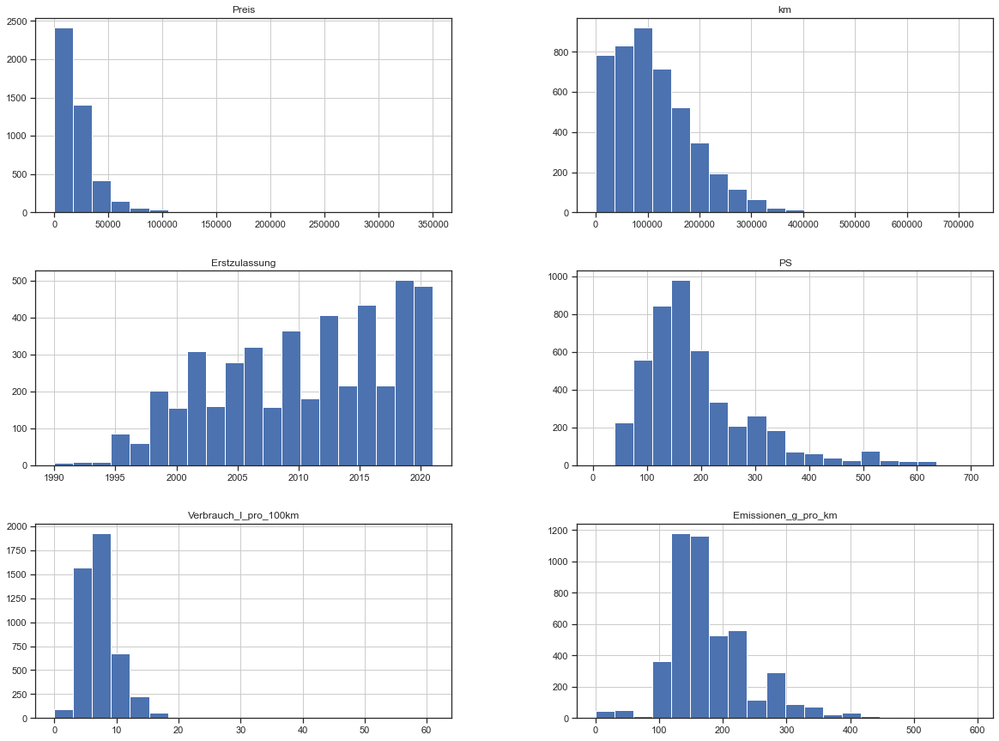

In [80]:
# Erstellen von Histogrammen der numerischen Variablen
AutoDF.hist(bins=20, figsize=(20,15))
plt.show("notebook")

Für einzelne Variablen wie bspw. *km* oder *PS* lassen sich rechtsschiefe Verteilungen erkennen. Vor allem bei Erstzulassung lässt sich aber kein Schwerpunkt in der Vertilung erkennen, lediglich ein leichter Trend zu weniger alten Fahrzeugen.  
Da vor allem der Preis für diese Untersuchung interessant ist, wird dieses Histogramm noch einmal detaillierter dargestellt.

In [81]:
#Erstellung eines detaillierten Histogramm zur Variable Preis
fig = px.histogram(AutoDF, x="Preis",title="Distribution over price (Euro)")
fig.show()

## Korrelationsanalyse

Um eine erste Übersicht über mögliche Zusammenhänge zwischen den verschiedenen Variablen zu erhalten, wird zunächst ein Pairplot erstellt. Der Plot eignet sich besonders für numerische Variablen, durch farbliche Markierung kann allerdings auch eine kategoriale Variable dargestellt werden.

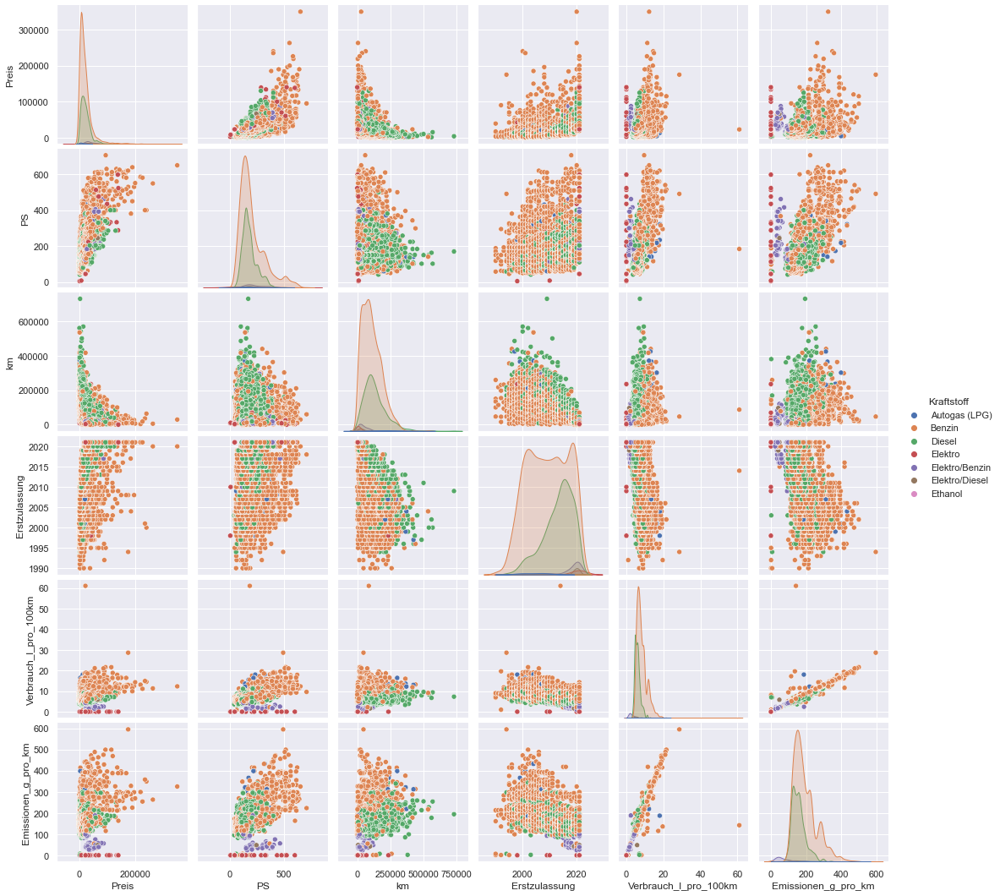

In [111]:
sns.pairplot(data=AutoDF, vars=["Preis","PS","km","Erstzulassung","Verbrauch_l_pro_100km","Emissionen_g_pro_km"],
             hue="Kraftstoff",)

Tatsächlich können im Pairplot Zusammenhänge zwischen einzelnen Variablen erkannt werden. Vor allem die starke Korrelation zwischen Verbrauch und Emissionen fällt im Plot auf, ist allerdings selbstverständlich da mit höherem Verbrauch in der Regel auch mehr Emissionen erzeugt werden.
Doch auch weniger starke Abhängigkeiten können erkannt werden wie bspw. zwischen PS und Preis oder zwischen PS und Verbrauch.

Durch die farbliche Markierung der Kraftstoffart lässt sich hier auch schon gut erkennen, dass Benzin Fahrzeuge eher einen höheren Verbrauch und höhere Emissionen erzeugen als Diesel Fahrzeuge. Auch Autogas scheint tendentiell mehr Emissionen zu erzeugen als Diesel Fahrzeuge.

Nach der optischen Darstellung sollen nun im nächsten Schritt die Abhängigkeiten noch einmal in Zahlen dargestellt werden.

In [83]:
# Erstellen einer Korrelationsmatrix
corr_matrix = AutoDF.corr()
corr_matrix

,Preis,km,Erstzulassung,PS,Verbrauch_l_pro_100km,Emissionen_g_pro_km,Alufelgen,Sitzheizung,Klimaanlage,Einparkhilfe,Navigationssystem
Preis,1.000000,-0.421786,0.375126,0.701054,0.234156,0.232313,-0.147829,0.002652,-0.089297,0.037044,0.041534
km,-0.421786,1.000000,-0.568111,-0.127463,0.210769,0.255970,0.108523,-0.119208,-0.031420,-0.153058,-0.142417
Erstzulassung,0.375126,-0.568111,1.000000,0.117229,-0.496235,-0.506678,-0.055640,0.201850,0.068506,0.311526,0.315454
PS,0.701054,-0.127463,0.117229,1.000000,0.563397,0.579788,-0.141854,0.011839,-0.142537,0.015200,0.062163
Verbrauch_l_pro_100km,0.234156,0.210769,-0.496235,0.563397,1.000000,0.933004,-0.046658,-0.074132,-0.080756,-0.147325,-0.118214
Emissionen_g_pro_km,0.232313,0.255970,-0.506678,0.579788,0.933004,1.000000,-0.043258,-0.079571,-0.082951,-0.153974,-0.123025
Alufelgen,-0.147829,0.108523,-0.055640,-0.141854,-0.046658,-0.043258,1.000000,0.055907,0.179344,0.042522,0.047007
Sitzheizung,0.002652,-0.119208,0.201850,0.011839,-0.074132,-0.079571,0.055907,1.000000,0.125800,0.203946,0.244613
Klimaanlage,-0.089297,-0.031420,0.068506,-0.142537,-0.080756,-0.082951,0.179344,0.125800,1.000000,0.065015,0.099932
Einparkhilfe,0.037044,-0.153058,0.311526,0.015200,-0.147325,-0.153974,0.042522,0.203946,0.065015,1.000000,0.320108


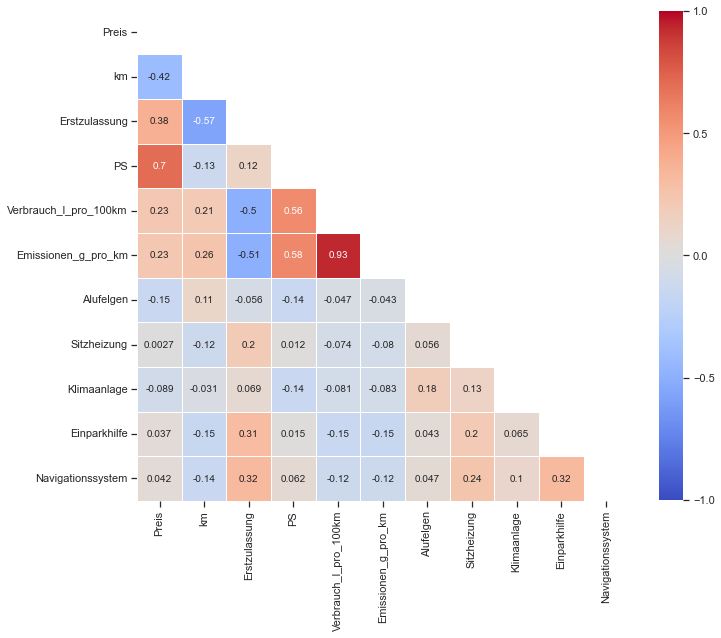

In [84]:
# Erstellen einer Heatmap um Abhängigkeiten zwischen den verschiedenen Variablen zu visualisieren

# Einstellung um nur den relevanten Teil der Matrix zu plotten
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)]= True

# Erstellen der Heatmap
plt.subplots(figsize=(11, 15))
heatmap = sns.heatmap(corr_matrix, 
                      mask = mask, 
                      square = True, 
                      linewidths = .5,
                      cmap = 'coolwarm',
                      cbar_kws = {'shrink': .6,
                                'ticks' : [-1, -.5, 0, 0.5, 1]},
                      vmin = -1,
                      vmax = 1,
                      annot = True,
                      annot_kws = {"size": 10})

Durch die Korrelationsmatrix sowie deren Visualisierung mit einer Heatmap können Korrelationen zwischen den verschiedenen Variablen auf einen Blick erkannt werden. Die farblich besonders saturierten Feleder (dunkelblau und dunkelrot) weisen auf besonders starke Abhängigkeit hin.  

Da die offensichtlichsten Korrelationen (bspw. zwischen PS, Verbrauch und Emissionen) naheliegend und daher nicht besonders interessant sind, soll im Folgenden näher untersucht werden, welche Faktoren einen besonderen Einfluss auf den Preis haben.

In [85]:
# Berechnung der Korrelationen der einzelnen Variablen zur Variable "Preis"
corr = AutoDF.corr()
corr['Preis'].sort_values(ascending=False)

Preis                    1.000000
PS                       0.701054
Erstzulassung            0.375126
Verbrauch_l_pro_100km    0.234156
Emissionen_g_pro_km      0.232313
Navigationssystem        0.041534
Einparkhilfe             0.037044
Sitzheizung              0.002652
Klimaanlage             -0.089297
Alufelgen               -0.147829
km                      -0.421786
Name: Preis, dtype: float64

Von den numerischen Variablen haben *PS*, *km* und *Erstzulassung* den höchsten Einfluss auf den Preis. Diese Variablen sollen daher näher untersucht werden. Dazu wird ein lmplot genutzt:

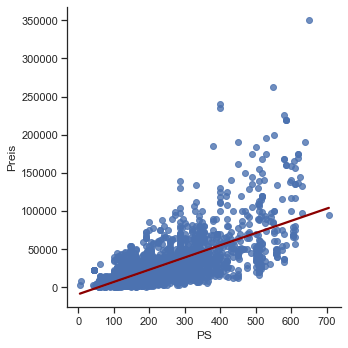

In [86]:
# Plot mit Trendlinie für PS & Preis
sns.lmplot(x='PS', y='Preis', data=AutoDF, 
line_kws={'color': 'darkred'}, ci=False);

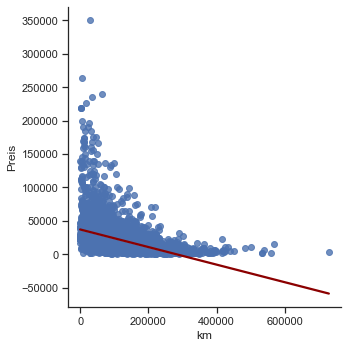

In [87]:
# Plot mit Trendlinie für km & Preis
sns.lmplot(x='km', y='Preis', data=AutoDF, 
line_kws={'color': 'darkred'}, ci=False);

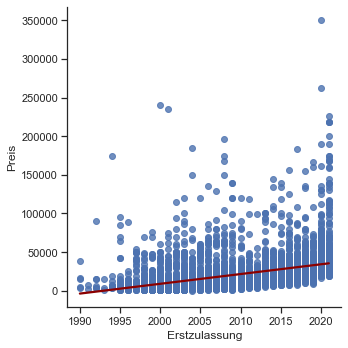

In [88]:
# Plot mit Trendlinie für Erstzulassung & Preis
sns.lmplot(x='Erstzulassung', y='Preis', data=AutoDF, 
line_kws={'color': 'darkred'}, ci=False)

Zusätzlich wird hier noch ein Boxplot erstellt, an welchem die Verteilung sowie Ausreißer besser erkannt werden können. Hier fällt auf, dass Ausreißer vor allem Luxusmarken wie Lamborghini, Bentley oder Porsche sind oder sehr teuere Modelle von bspw. BMW (BMW Z8).

In [89]:
# Erstellung eines Boxplots zur Preis & Erstzulassung
fig = px.box(data_frame=AutoDF,x="Erstzulassung", y="Preis",
                 hover_name="Titel")
fig.show()

Wie auch zuvor schon vermutet lässt sich hier nochmal klar bestätigen (durchschnittlich):  
    1. Mit steigenden PS steigt auch der Preis  
    2. Mit steigendem Kilometerstand sinkt der Preis  
    3. Mit steigendem Jahr der Erstzulassung steigt auch der Preis  

#### Marke & Preis

Mit Hilfe eines Boxplots wollen wir außerdem untersuchen, wie sich die Preisverteilung bei den unterschiedlichen Automarken verhält. Um das besonders übersichtlich zu gestalten, wird die Anzeige aufsteigend nach dem Durchschnittspreis je Marke sortiert:

In [90]:
#sortieren der Marken nach Durchschnittspreis
sorted_nb = AutoDF.groupby(['Marke'])['Preis'].median().sort_values()
#sorted_nb

<AxesSubplot:xlabel='Preis', ylabel='Marke'>

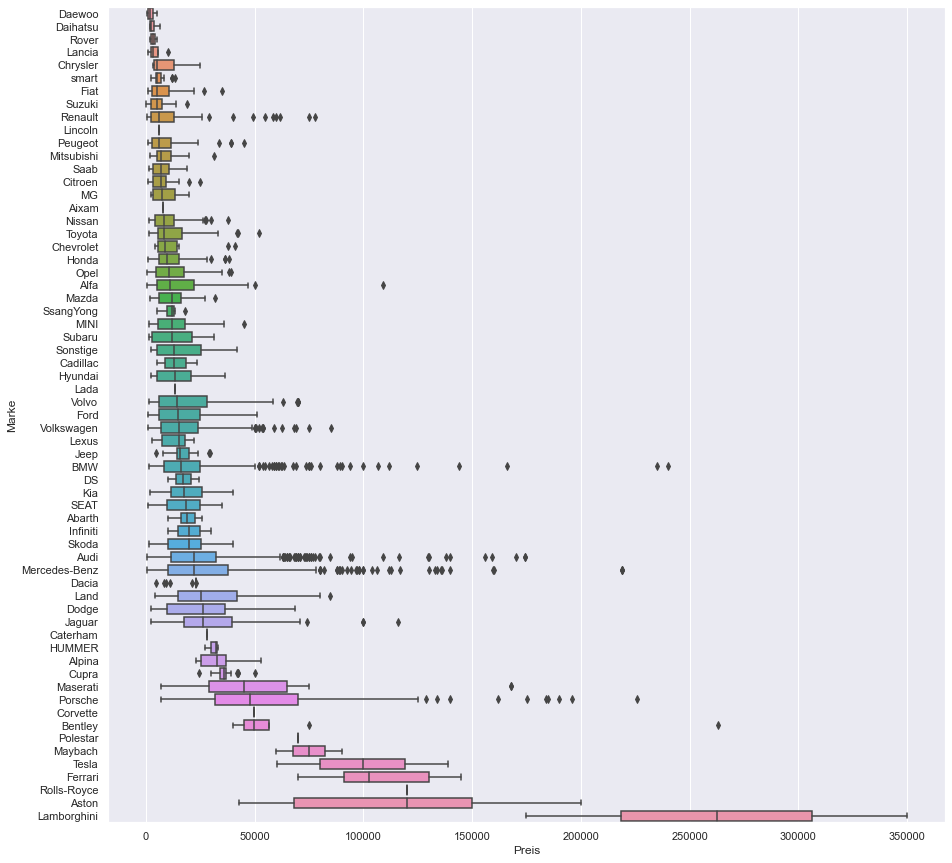

In [91]:
#Anpassen der seaborn Plotgröße um den Plot übersichtlich darzustellen
sns.set(rc={'figure.figsize':(15,15)})
#Erzeugen des Plots
sns.boxplot(x=AutoDF['Preis'], y=AutoDF['Marke'], order=list(sorted_nb.index),orient="h")

Am Plot mit Sortierung lässt sich gut erkennen, dass Luxus-Automarken wie Lamborghini, Aston Martin und Rolls-Royce auch bei gebrauchten Fahrzeugen im Schnitt die teuersten Angebote darstellen. Vor allem bei Lamborghini und Aston Martin ist fällt auch, dass die Preisspanne innerhalb der vier Quartile des Boxplots sehr groß ist.  
Günstige Fahrzeuge werden von den Marken Daewoo, Daihatsu und Rover angeboten. Am Beispiel Rover können wir erkennen, dass auf Grund einer geringen Auswahl an Fahrzeugangeboten mit einem sehr hohen Kilometerstand schnell ein sehr geringer durschnittlicher Preis entstehen kann:

In [92]:
AutoDF.loc[AutoDF['Marke']=='Rover']

,Titel,Version,Untertitel,Preis,km,Erstzulassung,PS,Getriebe,Kraftstoff,Verbrauch_l_pro_100km,Emissionen_g_pro_km,Marke,Alufelgen,Sitzheizung,Klimaanlage,Einparkhilfe,Navigationssystem,Stadt
3558,Rover 75,2.0 V6 Club Leer Memory Clima .,NaN,1650,303358,1999.0,150,Schaltgetriebe,Benzin,9.4,232,Rover,False,False,False,False,False,APELDOORN
3903,Rover 75,"2.5 V6 Sterling 177Pk Automaat (6 CILINDER, CL...",NaN,4945,157651,2000.0,177,Automatik,Benzin,11.6,286,Rover,False,False,False,False,False,IJssel


#### Ausstattung & Preis

Als nächstes soll untersucht werden, inwiefern die Ausstattungsmerkmale einen eindeutigen Einfluss auf den Preis haben.

In [93]:
Austtattung=['Klimaanlage','Alufelgen','Sitzheizung','Einparkhilfe','Navigationssystem']
Austtattung

['Klimaanlage',
 'Alufelgen',
 'Sitzheizung',
 'Einparkhilfe',
 'Navigationssystem']

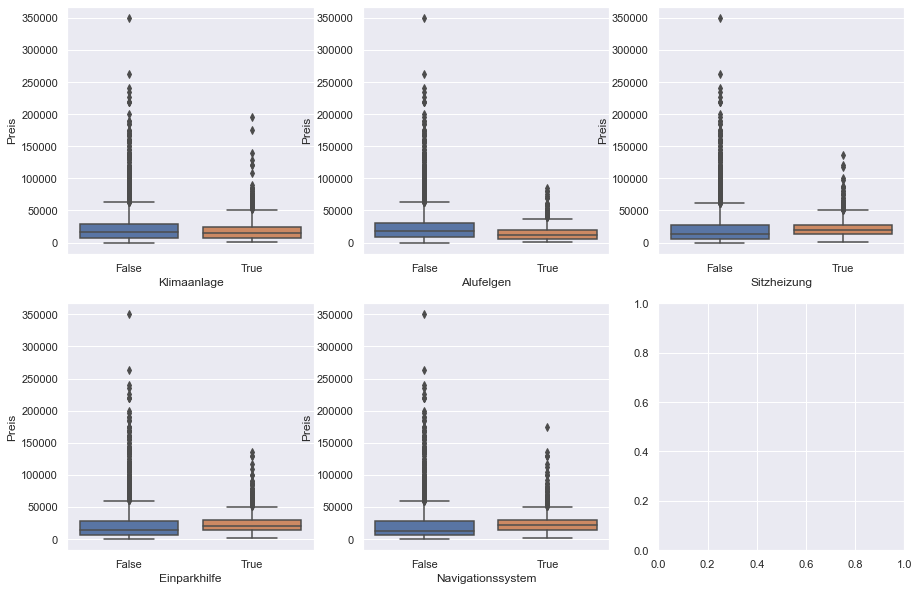

In [94]:
fig, ax = plt.subplots(2, 3, figsize=(15, 10))
for var, subplot in zip(Austtattung, ax.flatten()):
    sns.boxplot(x=var, y='Preis', data=AutoDF, ax=subplot)

Fazit: durch die Boxplots lässt sich leider kaum eine Auswirkung der Ausstattungsmerkmale auf den Preis erkennen. Vermutlich ist die Beschreibung der Ausstattung oft nicht detailliert gepflegt. Man kann vermuten, dass vor allem bei modernen und teuren Autos eine Klimaanlage bspw. selbstverständlich ist und daher nicht extra im Untertitel der Anzeige erwähnt wird.

#### Kraftstoff & Preis

<AxesSubplot:title={'center':'Durschnittlicher Preis nach Kraftstoff'}, xlabel='Kraftstoff'>

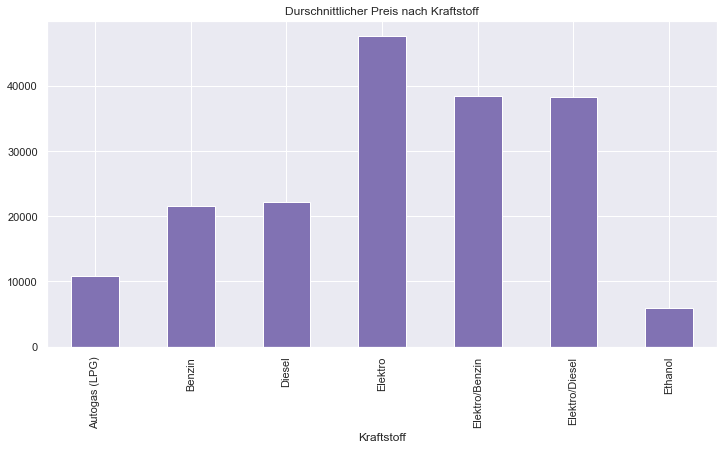

In [95]:
# Gruppieren des DF nach Kraftstoff mit durschnittlichem Preis
PriceAveragePerKraftstoff=AutoDF.groupby(by="Kraftstoff")["Preis"].mean()
# Erzeugen des Bar Plots mit den zuvor erzeugten Gruppierungen
PriceAveragePerKraftstoff.plot(kind="bar",figsize=(12,6),color="m",title="Durschnittlicher Preis nach Kraftstoff")

Am Balkendiagramm können wir erkennen, dass Elektrofahrzeuge und Hybride im Durschnitt am teuersten gehandelt werden, Fahrzeuge mit Ethanol oder Autogas als Kraftstoff am günstigsten.  
Da bei diesen Untersuchungen allerdings auch die Anzahl an vorliegenden Datensätzen eine Rolle spielt, wird diese noch einmal zusätzlich in einem weiteren Plot visualisiert:

<AxesSubplot:xlabel='Kraftstoff', ylabel='Preis'>

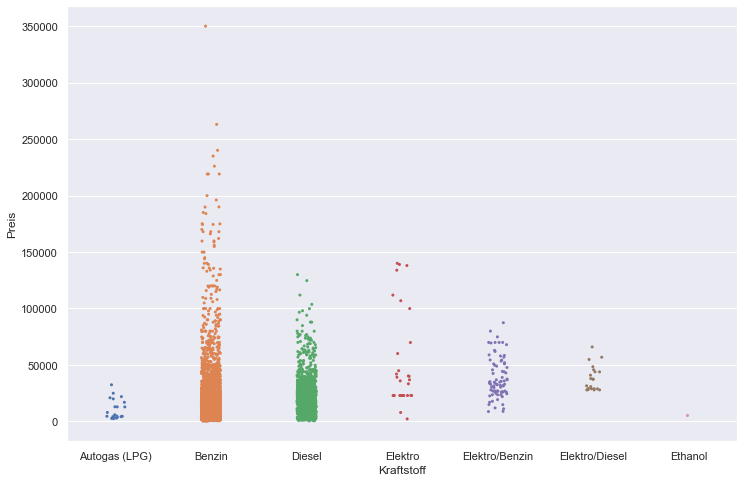

In [113]:
#Anpassen der seaborn Plotgröße um den Plot übersichtlich darzustellen
sns.set(rc={'figure.figsize':(12,8)})
sns.stripplot(data=AutoDF, x="Kraftstoff", y="Preis" , size=3 )

Hier können wir erkennen, dass nur für Benzin und Diesel sehr viele Datensätze vorliegen - vor allem Ethanol scheint nur durch einen Datensatz vertreten zu sein und sollte daher mit Vorsicht interpretiert werden.

In [97]:
fig=px.scatter(AutoDF,x="PS",y="Preis",color="Emissionen_g_pro_km",size="Verbrauch_l_pro_100km",
              hover_data=["Marke","Titel","Kraftstoff"],title="Price over PS",
              trendline="ols")
fig.show()

#### Getriebe & Preis

Als nächstes wird der Einfluss der Art des Getriebes auf den Preis untersucht:

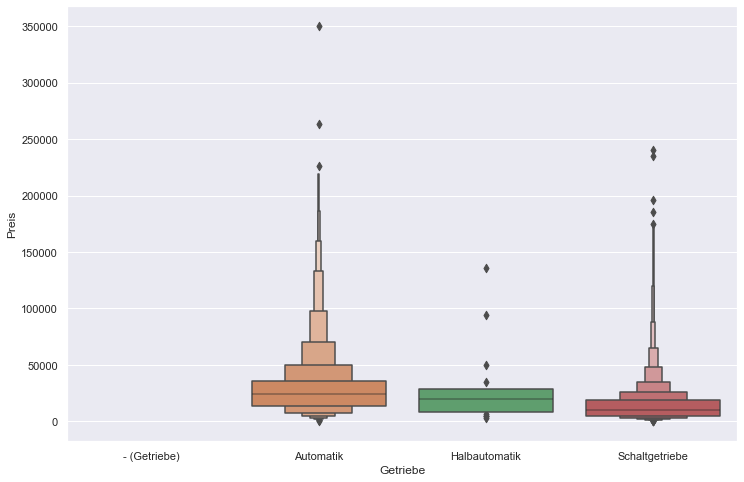

In [114]:
# Erstellen eines erweiterten Boxplots zu Getriebe & Preis
sns.boxenplot(data=AutoDF, x="Getriebe", y="Preis");

Am Boxplot können wir erkennen, das Fahrzeuge mit Schaltgetriebe im Durchschnitt am günstigsten verkauft werden, Fahrzeuge mit Automatik im Durchschnitt am teuersten.  
Das kann noch etwas detaillierter dargstellt werden:

In [99]:
#Erstellen einzelner DF nach Getriebe für folgende Visualisierung
Automatik=AutoDF[AutoDF["Getriebe"]=="Automatik"]
Schaltgetriebe=AutoDF[AutoDF["Getriebe"]=="Schaltgetriebe"]
Halbautomatik=AutoDF[AutoDF["Getriebe"]=="Halbautomatik"]

In [100]:
#Erstellen von Series Objekten mit den entsprechenden Preisen
npAutomatik = Automatik["Preis"]
npSchaltgetriebe = Schaltgetriebe["Preis"]
npHalbautomatik = Halbautomatik["Preis"]
# Zusammenfassen der Series Objekte zu einer Liste
data = [npAutomatik.values, npSchaltgetriebe.values, npHalbautomatik.values]

# Parameter für Plot
group_labels = ['Automatik', 'Schaltgetriebe', 'Halbautomatik']
colors = ['#462EDE', '#DE2EBE', '#FF8033']

# Erstellen des Plots mit zuvor erzeugter Liste und Parametern
fig = ff.create_distplot(data, group_labels, 
                         bin_size=3000, show_rug=False)

# Anpassung Titetl
fig.update_layout(title_text='Preisverteilung nach Getriebe')
fig.show()

### Untersuchung von Unterschieden zwischen Automarken

Neben den zuvor schon festgestellten Unterschieden im Preis sollen nun auch noch weitere Unterschiede zwischen den Automarken untersucht werden.
Dazu werden die numerischen Variablen der Marken zunächst nach dem Durchschnitt gruppiert.

In [102]:
MarkenGruppiert=AutoDF.groupby(by="Marke").mean()
MarkenGruppiert

,Preis,km,Erstzulassung,PS,Verbrauch_l_pro_100km,Emissionen_g_pro_km,Alufelgen,Sitzheizung,Klimaanlage,Einparkhilfe,Navigationssystem
Marke,,,,,,,,,,,
Abarth,18979.142857,34271.285714,2017.142857,162.571429,6.585714,155.714286,0.000000,0.000000,0.571429,0.142857,0.285714
Aixam,7950.000000,11149.000000,2010.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Alfa,16468.685185,108397.574074,2006.777778,184.629630,8.590741,205.333333,0.166667,0.018519,0.185185,0.074074,0.055556
Alpina,33811.333333,130511.000000,2010.500000,366.333333,8.533333,208.333333,0.000000,0.333333,0.000000,0.333333,0.333333
Aston,112095.238095,44050.190476,2008.952381,492.619048,15.819048,373.095238,0.000000,0.142857,0.142857,0.000000,0.047619
Audi,25795.776119,110393.247761,2012.222388,224.489552,6.992239,170.143284,0.126866,0.256716,0.292537,0.240299,0.313433
BMW,21189.422330,132068.305825,2007.970874,216.035599,7.697735,186.805825,0.156958,0.257282,0.176375,0.265372,0.322006
Bentley,73719.333333,93012.666667,2007.111111,536.444444,16.922222,395.333333,0.111111,0.111111,0.111111,0.222222,0.222222
Cadillac,13830.000000,140875.000000,2011.000000,264.000000,12.433333,289.333333,0.000000,0.000000,0.000000,0.000000,0.000000


In [115]:
# Erstellen eines Barcharts zum durchschnittlichen Verbrauch pro Marke
fig=px.bar(x=MarkenGruppiert.index,y=MarkenGruppiert["Verbrauch_l_pro_100km"],title="Durchschnittlicher Verbrauch pro Automarke (Liter/100km)")
fig.show()

Hier fällt auf, dass Luxus- & Sportmarken wie bspw. Ferrari, Lamborghini und Bentley im Schnitt den höchsten Verbrauch haben. Reine Elektromarken wie Polestar oder Tesla haben logischerweise einen durchschnittlichen Verbrauch von 0.

Als nächstes soll die Eigenschaft *PS* untersucht werden auf Unterschiede zwischen den Automarken.

<AxesSubplot:xlabel='PS', ylabel='Marke'>

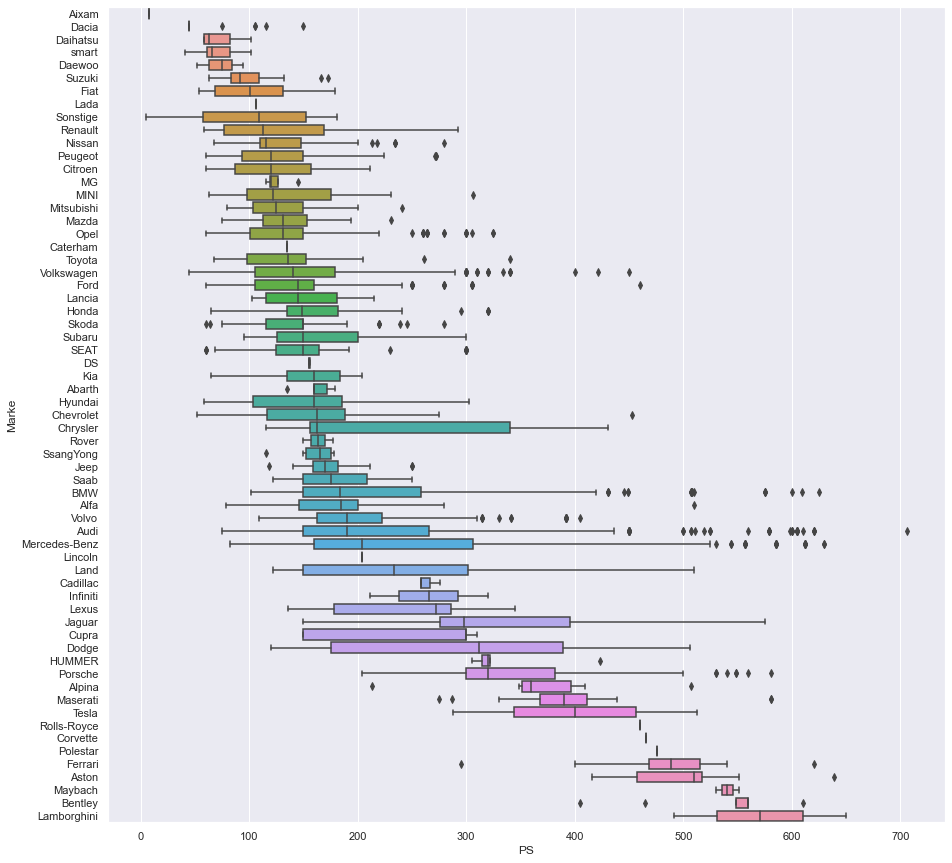

In [117]:
#sortieren der Marken nach Durchschnitts PS
sorted_ps = AutoDF.groupby(['Marke'])['PS'].median().sort_values()
#Anpassen der Größe des Plots
sns.set(rc={'figure.figsize':(15,15)})
#Erzeugen des Plots
sns.boxplot(x=AutoDF['PS'], y=AutoDF['Marke'], order=list(sorted_ps.index),orient="h")

Ähnlich wie beim Verbrauch fallen auch hier bei den PS Luxusmarken wie Lamborghini & Bentley auf. Interessant ist hier jedoch, das auch Maybach sehr weit vorne dabei ist, zuvor jedoch nicht beim Verbrauch in den Top 3 gelandet ist (lediglich Platz 9 wie in Liste unten zu sehen ist). Maybach scheint daher eher effiziente Motoren zu verwenden.

In [119]:
sorted_verbrauch = AutoDF.groupby(['Marke'])['Verbrauch_l_pro_100km'].median().sort_values()
sorted_verbrauch

Marke
Aixam             0.00
Dacia             0.00
Tesla             0.00
Polestar          0.00
Sonstige          2.40
smart             4.90
Daihatsu          4.90
SEAT              5.40
Skoda             5.40
Cupra             5.50
DS                5.70
Ford              6.00
Kia               6.10
MINI              6.10
Volkswagen        6.10
SsangYong         6.20
Opel              6.20
Lada              6.20
Citroen           6.20
Peugeot           6.40
Audi              6.40
Nissan            6.40
Fiat              6.40
Suzuki            6.40
Mitsubishi        6.60
Chevrolet         6.60
Toyota            6.65
Mazda             6.70
Volvo             6.75
Abarth            6.80
Renault           7.00
Daewoo            7.00
Hyundai           7.20
Honda             7.20
Mercedes-Benz     7.50
MG                7.50
BMW               7.55
Chrysler          7.80
Caterham          8.30
Subaru            8.60
Alpina            8.70
Alfa              8.75
Lancia            8.80
Infin

## Kartenvisualisierung

Als nächstes werden wird der Standort der zum Verkauf angebotenen Fahrzeuge in einer Landkarte visualisiert. <br>
Für diese Zwecke wurde beim Webcrawling das Attribut Location von Autoscout24 abgezogen und anschließend in der Datenaufbereitung der Stadtname und das Land als extra Spalte angelegt. <br>
Mithilfe des Geolocators werden jeder Stadt Longitude und Latitude zugeordnet und im Dataframe geoDF gespeichert. Dieses Dataframe wird anschließend über den Index mit dem AutoDF gejoined.

Aufgrund der Datenmenge wird für die Kartenvisualisierung nur ein Ausschnitt von 100 Datenpunkte verwendet. Diese werden in *AutoDFsmall* gespeichert.

In [105]:
AutoDFsmall = AutoDF[0:100]

In [106]:
geolocator = Nominatim(user_agent="my_app")
geoDF = pd.DataFrame()
for city in AutoDFsmall.index:
    try:
        location = geolocator.geocode(AutoDFsmall['Stadt'][city])
        geoDF = geoDF.append({"longitude": location.longitude, "latitude": location.latitude}, ignore_index=True)  
    except:
        geoDF = geoDF.append({"longitude": None, "latitude": None}, ignore_index=True)
geoDF

,longitude,latitude
0,13.322287,52.457257
1,9.278869,45.639544
2,11.048029,46.314475
3,8.816553,50.520168
4,8.764870,51.718960
5,7.136807,51.594201
6,11.280749,50.893925
7,11.280749,50.893925
8,7.340479,51.320742
9,9.278869,45.639544


In [107]:
#Index von AutoDF zurücksetzen, da aufgrund der Entfernung der Null-Values bei Verbrauch und Emissionen viele Zeilen weggefallen sind
#sonst kann nicht mit GeoDF gejoined werden
AutoDFsmall = AutoDFsmall.reset_index(drop=True)

#Join von GeoDF und AutoDF über Index
AutoDFsmall = pd.merge(AutoDFsmall, geoDF, left_index=True, right_index=True)

Unter Verwendung von Longitude und Latitude werden die Fahrzeugstandorte auf einer Folium Map visualisiert. <br>
Zusätzlich wird jedem Datenpunkt eine Pop-Up Beschreibung hingefügt, welche Stadtname, Autobeschreibung und Preis beinhaltet.

In [108]:
m = folium.Map([50.0 , 10.0],zoom_start=4)
for i in AutoDFsmall.index:
    try:
        folium.Marker( location=[ AutoDFsmall['latitude'][i], AutoDFsmall['longitude'][i] ], popup = [AutoDFsmall['Stadt'][i], AutoDFsmall['Titel'][i], AutoDFsmall['Preis'][i]]).add_to(m)
    except:
        continue
m

## Regression

In diesem Kapitel wird ein einfaches Regressionsmodell zur Bestimmmung des Fahrzeugpreises auf Basis ausgewählter Features berechnet. <br>
Hierfür wird die lineare Regression gewählt. Da die Regression nicht Fokus des Projekts ist, wurde auf einen Split der Daten in Trainings- und Testdaten verzichtet. <br>
Zudem wird lediglich ein Modell berechnet und somit auf den Vergleich verschiedener Modell mit anschließender Auswahl des besten Modells verzichtet. <br>
Für das Modell wurden jene Features ausgewählt, die in der vorherigen explorativen Datenanalyse die größte Korrelation zu *Preis* aufweisen. <br>
Dazu gehören folgende Features:
* PS
* km
* Erstzulassung
* Kraftstoff
* Verbrauch_l_pro_100km
* Emissionen_g_pro_km

Da die Features Verbrauch und Emissionen eine sehr hohe Korrelation untereinander aufweisen, soll nur eines der beiden Features verwendet werden. Da die Abhängigkeit von Preis zu Verbrauch minimal höher ist als zu Emissionen, wird der Verbrauch gewählt.


In [109]:
# Fit Model
lm = smf.ols(formula='Preis ~ PS + km + Kraftstoff + Erstzulassung + Verbrauch_l_pro_100km', data=AutoDF).fit()
# Full summary
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Preis   R-squared:                       0.634
Model:                            OLS   Adj. R-squared:                  0.633
Method:                 Least Squares   F-statistic:                     787.4
Date:                Tue, 13 Sep 2022   Prob (F-statistic):               0.00
Time:                        19:56:18   Log-Likelihood:                -50282.
No. Observations:                4563   AIC:                         1.006e+05
Df Residuals:                    4552   BIC:                         1.007e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept                    -9.719e+05    9.9e+04     -9.814      0.000   -1.17e+06   -7.78e+05
Kraftstoff[T.Benzin]          -580.8589   3276.059     -0.177      0.859   -7003.525    5841.807
Kraftstoff[T.Diesel]          5084.3293   3309.632      1.536      0.125   -1404.155    1.16e+04
Kraftstoff[T.Elektro]         2.346e+04   4266.256      5.500      0.000    1.51e+04    3.18e+04
Kraftstoff[T.Elektro/Benzin]  5039.1362   3770.621      1.336      0.181   -2353.111    1.24e+04
Kraftstoff[T.Elektro/Diesel]  7925.3502   4632.848      1.711      0.087   -1157.281     1.7e+04
Kraftstoff[T.Ethanol]         -753.9051   1.51e+04     -0.050      0.960   -3.04e+04    2.89e+04
PS                             141.3709      3.127     45.204      0.000     135.240     147.502
km                              -0.0869      0.004    -23.866      0.000      -0.094      -0.080
Erstzulassung                  482.5563     48.872      9.874      0.000     386.743     578.370
Verbrauch_l_pro_100km          631.4028    140.165      4.505      0.000     356.611     906.194
==============================================================================
Omnibus:                     4435.504   Durbin-Watson:                   1.800
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           423808.392
Skew:                           4.457   Prob(JB):                         0.00
Kurtosis:                      49.364   Cond. No.                     6.18e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.18e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Das Modell hat einen R-Squared von 63,1% und einen Adjusted R-Squared von 63,0% und schneidet somit mittelmäßig ab. <br>
R-squared ist eine Kennzahl zur Beurteilung der Anpassungsgüte eines Modells und nimmt einen Wert zwischen 0% und 100% an. Als Bezugsbasis wird der Durchschnitt verwendet. <br>
In statistischen Methoden wird meist lieber der adjusted R-squared genutzt. Da dieser die degrees of freedom miteinbezieht, lässt sich durch adj. R-squared einen besseren Rückschluss auf die Gesamtpopulation der Datensätze ziehen. Dieser ist meistens etwas schlechter als R-squared. <br>
F-statistics ist die Menge der systematischen Varianz (MSM) geteilt durch die Menge der unsystematischen Varianz (MSR). Die Kennzahl gibt an, in welcher Höhe das Modell die Ergebnisausgabe der abhängigen Variable verbessert hat, verglichen zu Ungenauigkeit im Modell. Je höher F-statistics, desto besser. Mit einem Wert von 781 ist F-Statistics schneidet auch diese Kennzahl mittelmäßig ab. <br>
Verbesserungspotenzial gibt es bei den Featuren: <br>
Die p-Values einer Kraftstoff Kategorien liegen über 0,05% und haben daher statistisch gesehen keinen Einfluss auf den Preis. Ein sinnvoller Schritt wäre hier das Zusammenfassen einiger Kraftstoffarten. Ethanol als Kraftstoff kommt in diesem Datensatz nur einmal vor und sollte für das Modell entfernt werden. Elektro/Diesel und Elektro/Benzin könnten beispielsweise in der Kategorie Hypride zusammengefasst werden. Anschließend kann das Modell nochmal trainiert werden und weitere Verbesserungspotentiale identifiziert werden. <br>

Dies ist jedoch nicht mehr Fokus des Projekts. Diese lineare Regression dient lediglich als Ausblick, was mit diesem Datensatz noch alles möglich gewesen wäre.